## Image classification with Convolutional Neural Networks

## My dataset: 'Old Polish Cars'

In [0]:
# Put these at the top of every notebook, to get automatic reloading and inline plotting
%reload_ext autoreload
%autoreload 2
# %matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [0]:
import warnings
warnings.filterwarnings('ignore')
from pathlib import Path
import shutil as sh

In [0]:
# This file contains all the main external libs we'll use
from fastai.imports import *

In [0]:
from fastai.transforms import *
from fastai.conv_learner import *
from fastai.model import *
from fastai.dataset import *
from fastai.sgdr import *
from fastai.plots_wcz import *

In [0]:
PATH = "data/old_polish_cars/old_polish_cars_v5_photos-split/"

In [0]:
sz=224
# sz=128

## Easy steps to train a world-class image classifier

1. Enable data augmentation, and precompute=True
1. Use `lr_find()` to find highest learning rate where loss is still clearly improving
1. Train last layer from precomputed activations for 1-2 epochs
1. Train last layer with data augmentation (i.e. precompute=False) for 2-3 epochs with cycle_len=1
1. Unfreeze all layers
1. Set earlier layers to 3x-10x lower learning rate than next higher layer
1. Use `lr_find()` again
1. Train full network with cycle_mult=2 until over-fitting

## Exploration

In [0]:
!ls {PATH}

train  valid


In [0]:
!ls {PATH}valid

Autobus Jelcz MZK     Fiat 125p		FSC Zuk      FSO Warszawa  Syrena 105
Autobus Jelcz Ogorek  Fiat 126p Maluch	FSO Polonez  Gazik	   ZSD Nysa


In [0]:
files = !ls {PATH}valid/"Fiat 126p Maluch" | head
files

['100_1487452822.24.jpg',
 '60_1487452789.18.jpg',
 '64_1487452793.54.jpg',
 '73_1487452802.96.jpg',
 '91_1487452816.32.jpg',
 'fp126p.1.000021.jpg',
 'fp126p.1.000022.jpg',
 'fp126p.1.000027.jpg',
 'fp126p.1.000065.jpg',
 'fp126p.1.000066.jpg']

In [0]:
files[9]

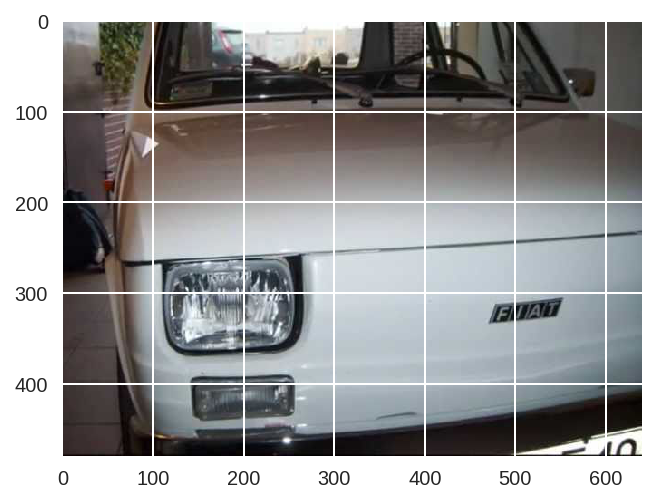

In [0]:
img = plt.imread(f'{PATH}valid/Fiat 126p Maluch/{files[9]}')
plt.imshow(img);

In [0]:
img.shape

In [0]:
img[50:51,150:152]

# Training

In [0]:
arch=resnet34
tfms = tfms_from_model(arch, sz)
data = ImageClassifierData.from_paths(PATH, tfms=tfms)

## Choosing a learning rate

In [0]:
learn = ConvLearner.pretrained(arch, data, precompute=True)

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /content/.torch/models/resnet34-333f7ec4.pth
100%|██████████| 87306240/87306240 [00:01<00:00, 59616235.59it/s]


100%|██████████| 16/16 [00:22<00:00,  1.39s/it]


In [0]:
lrf=learn.lr_find()

Widget Javascript not detected.  It may not be installed or enabled properly.


 85%|████████▍ | 117/138 [00:03<00:00, 36.00it/s, loss=6.9] 


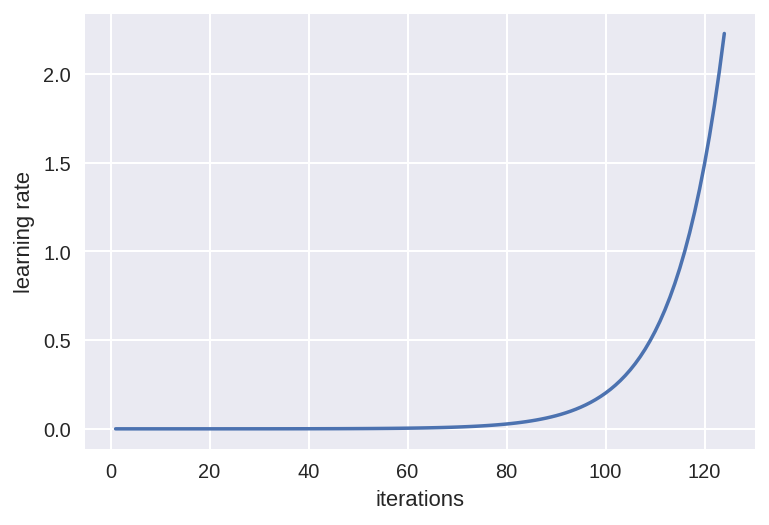

In [0]:
learn.sched.plot_lr()

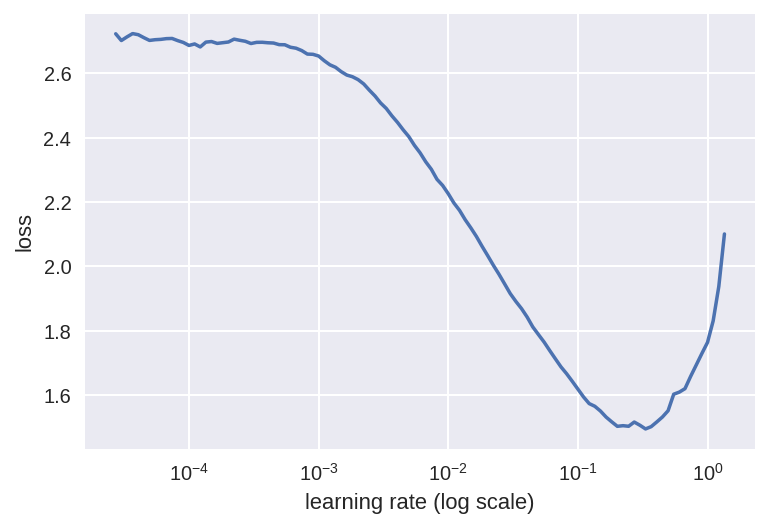

In [0]:
learn.sched.plot()

picked lr=0.08

In [0]:
0.8*10**-1

0.08000000000000002

## Initial training

In [0]:
learn = ConvLearner.pretrained(arch, data, precompute=True)
learn.fit(0.08, 3)

Widget Javascript not detected.  It may not be installed or enabled properly.


epoch      trn_loss   val_loss   accuracy   
    0      0.739474   0.428819   0.845918  
    1      0.462755   0.367587   0.872449  
    2      0.371907   0.298268   0.906122  



[array([0.29827]), 0.9061224494661604]

## Improving our model

### Data augmentation

In [0]:
tfms = tfms_from_model(resnet34, sz, aug_tfms=transforms_side_on, max_zoom=1.1)

In [0]:
def get_augs():
    data = ImageClassifierData.from_paths(PATH, bs=2, tfms=tfms, num_workers=1)
    x,_ = next(iter(data.aug_dl))
    return data.trn_ds.denorm(x)[1]

In [0]:
ims = np.stack([get_augs() for i in range(6)])

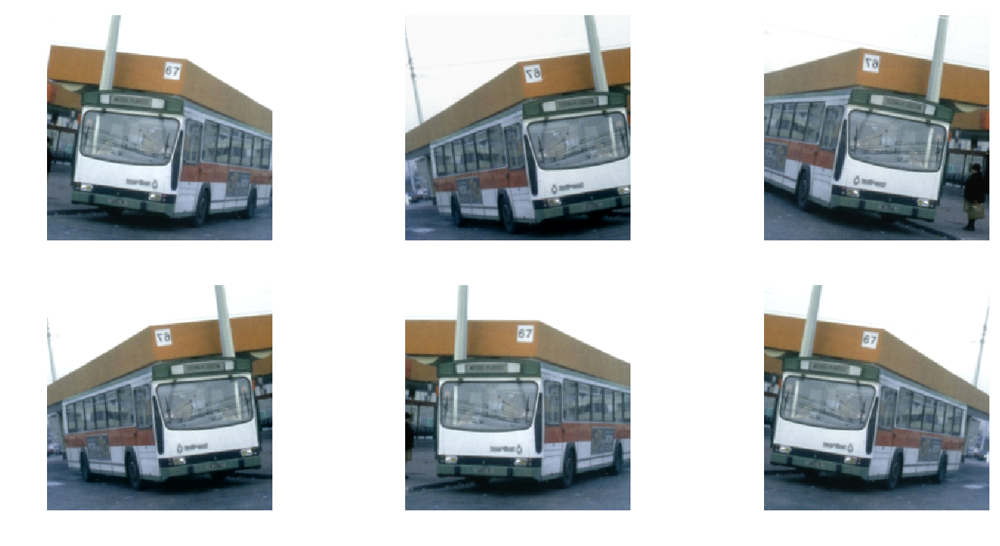

In [0]:
plots(ims, rows=2)

In [0]:
data = ImageClassifierData.from_paths(PATH, tfms=tfms)
learn = ConvLearner.pretrained(arch, data, precompute=True)

learn.fit(0.08, 3)

Widget Javascript not detected.  It may not be installed or enabled properly.


epoch      trn_loss   val_loss   accuracy   
    0      0.723534   0.457378   0.845918  
    1      0.449556   0.294081   0.894898  
    2      0.337068   0.374631   0.887755  



[array([0.37463]), 0.887755101797532]

In [0]:
learn.precompute=False

In [0]:
learn.fit(0.08, 3, cycle_len=1)

Widget Javascript not detected.  It may not be installed or enabled properly.


epoch      trn_loss   val_loss   accuracy   
    0      0.417983   0.252048   0.915306  
    1      0.379037   0.218844   0.923469  
 78%|███████▊  | 107/138 [02:37<00:45,  1.47s/it, loss=0.365]

    2      0.360236   0.213295   0.927551  



[array([0.2133]), 0.927551020164879]

In [0]:
learn.sched.plot_lr()

In [0]:
learn.save('224_lastlayer')

In [0]:
learn.load('224_lastlayer')

### Fine-tuning and differential learning rate annealing

In [0]:
learn.unfreeze()

In [0]:
lr=np.array([0.0008,0.008,0.08])

In [0]:
learn.fit(lr, 3, cycle_len=1, cycle_mult=2)

Widget Javascript not detected.  It may not be installed or enabled properly.


epoch      trn_loss   val_loss   accuracy   
    0      0.244895   0.098491   0.967347  
    1      0.130937   0.084103   0.968367  
 78%|███████▊  | 107/138 [02:58<00:51,  1.67s/it, loss=0.0657]

    2      0.063343   0.050986   0.984694  
    3      0.088928   0.09892    0.971429  
    4      0.049761   0.037117   0.986735  
 47%|████▋     | 65/138 [01:53<02:07,  1.74s/it, loss=0.0394]

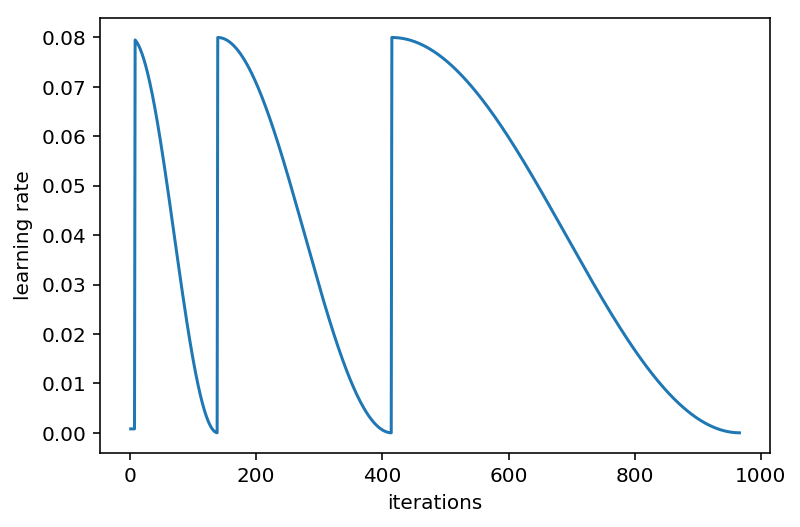

In [0]:
learn.sched.plot_lr()

In [0]:
learn.save('224_all')

In [0]:
learn.load('224_all')

## TTA

In [0]:
log_preds,y = learn.TTA()
accuracy(log_preds,y)

0.98673469387755097

## Predict on validation set

In [0]:
# this gives prediction for validation set. Predictions are in log scale
log_preds = learn.predict()
log_preds.shape

In [0]:
preds = np.argmax(log_preds, axis=1)  # from log probabilities to 0 or 1
probs = np.exp(log_preds[:,1])        # pr(dog)
print('preds: ', len(preds), preds[0:10], '\nprobs: ', len(probs), probs[0:20])

## Analyzing results

### Confusion matrix 

In [0]:
from sklearn.metrics import confusion_matrix

In [0]:
cm = confusion_matrix(data.val_y, preds)

In [0]:
preds = np.argmax(log_preds, axis=1)  # from log probabilities to 0 or 1
probs = np.exp(log_preds[:,1])        # pr(dog)

In [0]:
cm = confusion_matrix(y, preds)

[[97  0  0  0  0  0  0  0  0  1]
 [ 0 96  0  0  0  0  1  0  0  1]
 [ 0  0 96  1  0  0  0  0  0  1]
 [ 0  0  0 96  0  0  1  0  0  1]
 [ 0  0  0  0 98  0  0  0  0  0]
 [ 0  0  0  0  0 97  0  0  1  0]
 [ 0  0  0  0  0  0 97  1  0  0]
 [ 0  0  0  0  0  0  2 95  0  1]
 [ 0  0  0  0  0  0  0  0 98  0]
 [ 0  0  0  0  0  0  0  1  0 97]]


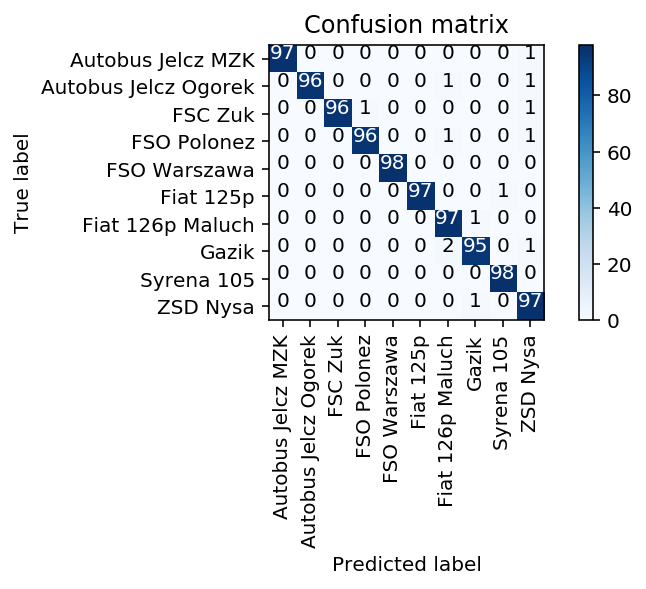

In [0]:
plot_confusion_matrix(cm, data.classes)

## Inference

In [0]:
# + code one file inference
# * code list of files inference

In [0]:
trn_tfms, val_tfms = tfms_from_model(arch, sz)

def inference(image_path):
    # fname is Path()
    ds = FilesIndexArrayDataset([image_path.name], np.array([0]), val_tfms, image_path.parent)
    dl = DataLoader(ds)
    learn.precompute = False
    preds = learn.predict_dl(dl)[0]
    probs = np.exp(preds)
    pred = np.argmax(preds)
    class_name = data.classes[pred]
    prob = probs[pred]
    return pred, class_name, prob

In [0]:
PATH2 = Path(f'{PATH}test1')
print(PATH2)
file_paths = sorted(PATH2.glob('*.jpg'))

for file_path in file_paths[0:10]:
    (pred, class_name, prob) = inference(file_path)
    print('%s\t%s\t%s\t%s' % (pred, class_name, prob, file_path.name))

In [0]:
def inference_array(image_paths):
    ds = FilesIndexArrayDataset([x.name for x in image_paths], np.zeros([len(image_paths)]), val_tfms, image_paths[0].parent)
    dl = DataLoader(ds)
    learn.precompute = False
    log_preds = learn.predict_dl(dl)
    probs = np.exp(log_preds)
    pred_class_ids = np.argmax(log_preds, axis=1)
    class_names = [data.classes[x] for x in pred_class_ids]
    # rslts = [(image_paths[x], pred_class_ids[x], class_names[x], np.max(probs[x,:])) for x in range(len(log_preds))]
    
    rslts = []
    
    for x in range(len(log_preds)):
        rslt = {
                'image_path': image_paths[x],
                'class_idx': pred_class_ids[x],
                'class_name': class_names[x],
                'prob': np.max(probs[x,:])
                }
        rslts.append(rslt)

    return rslts

In [0]:
PATH2 = Path(f'{PATH}test1')
print(PATH2)
image_paths = sorted(PATH2.glob('*.jpg'))
print(len(image_paths))
image_paths_short = image_paths[0:125]
print(len(image_paths_short))
rslts = inference_array(image_paths_short)
print(len(rslts))
print(rslts[0])

In [0]:
rslts

## Checking categories

In [0]:
def check_category(cat_path, dataset_path, bad_path):
    cat_path = dataset_path / cat
    image_paths = sorted(cat_path.glob('*.jpg'))
    print('image_paths: ', len(image_paths))
    rslts = inference_array(image_paths)
    bad_cat_path = bad_path / cat_path.name
    os.makedirs(bad_cat_path, exist_ok=True)

    incorrect_count = 0
    incorrect_results = []
    for idx, rslt in enumerate(rslts):
        correct = rslt['class_name'] == cat
        if not correct:
            incorrect_count = incorrect_count + 1
            image_path = rslt['image_path']
            dest_path = bad_cat_path / image_path.name
            print(idx, image_path.name, ',', rslt['class_name'])
            incorrect_results.append(rslt)
            # sh.move(image_path, dest_path)
        
    print(incorrect_count, len(image_paths_short), (len(image_paths_short) - incorrect_count) / len(image_paths_short))
    return incorrect_results

In [0]:
dataset_path = Path('data/old_polish_cars/old_polish_cars_v5_photos')
bad_path = Path('data/old_polish_cars/bad2')

for cat in data.classes:
    print(cat)
    rslts = check_category(cat, dataset_path, bad_path)

Autobus Jelcz MZK
image_paths:  722


AttributeError: 'ConvLearner' object has no attribute 'predict_dl'

## Analyzing results: looking at pictures

In [0]:
# This is the label for a val data
len(data.val_y)

980

In [0]:
data.val_y[0:200]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2])

In [0]:
img=data.val_ds.get_x(200)
img.shape

(477, 638, 3)

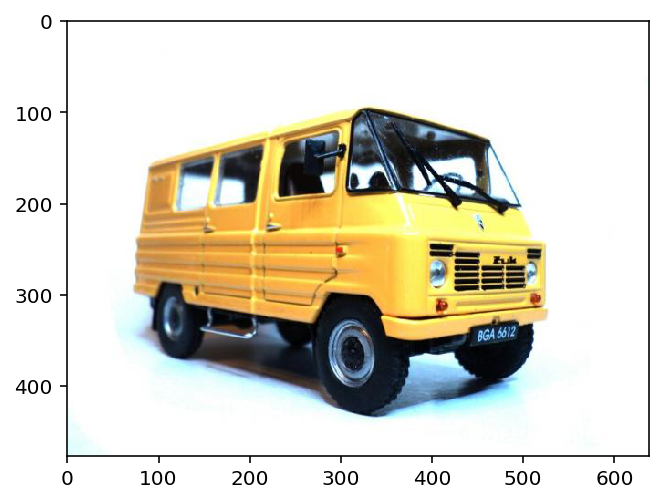

In [0]:
plt.imshow(img);

In [0]:
data.classes[data.val_ds.get_y(200)]

'FSC Zuk'

In [0]:
data.val_dl.dataset.get_x      

<bound method FilesDataset.get_x of <fastai.dataset.FilesIndexArrayDataset object at 0x7f502405d780>>

In [0]:
# from here we know that 'cats' is label 0 and 'dogs' is label 1.
data.classes

['Autobus Jelcz MZK',
 'Autobus Jelcz Ogorek',
 'FSC Zuk',
 'FSO Polonez',
 'FSO Warszawa',
 'Fiat 125p',
 'Fiat 126p Maluch',
 'Gazik',
 'Syrena 105',
 'ZSD Nysa']

In [0]:
np.exp(log_preds[:2])

array([[ 0.99999,  0.     ,  0.     ,  0.     ,  0.     ,  0.     ,  0.     ,  0.     ,  0.     ,  0.     ],
       [ 1.     ,  0.     ,  0.     ,  0.     ,  0.     ,  0.     ,  0.     ,  0.     ,  0.     ,  0.     ]], dtype=float32)

In [0]:
def rand_by_mask(mask): return np.random.choice(np.where(mask)[0], 4, replace=False)
def rand_by_correct(is_correct): return rand_by_mask((preds == data.val_y)==is_correct)

In [0]:
def plot_val_with_title(idxs, title):
    imgs = np.stack([data.val_ds[x][0] for x in idxs])
    title_probs = [probs[x] for x in idxs]
    print(title)
    return plots(data.val_ds.denorm(imgs), rows=1, titles=title_probs)

In [0]:
def plots(ims, figsize=(12,6), rows=1, titles=None):
    f = plt.figure(figsize=figsize)
    for i in range(len(ims)):
        sp = f.add_subplot(rows, len(ims)//rows, i+1)
        sp.axis('Off')
        if titles is not None: sp.set_title(titles[i], fontsize=16)
        plt.imshow(ims[i])

In [0]:
def load_img_id(ds, idx): return np.array(PIL.Image.open(PATH+ds.fnames[idx]))

def plot_val_with_title(idxs, title):
    imgs = [load_img_id(data.val_ds,x) for x in idxs]
    title_probs = [str(probs[x]) + " " + Path(data.val_ds.fnames[x]).stem for x in idxs]
    print(title)
    return plots(imgs, rows=1, titles=title_probs, figsize=(16,8))

In [0]:
rand_by_correct(False)

array([351, 491, 595, 734])

In [0]:
len(data.val_ds.fnames)

980

In [0]:
data.val_ds.fnames[100]

'valid/Autobus Jelcz Ogorek/Jelcz.043.221000289.jpg'

Correctly classified


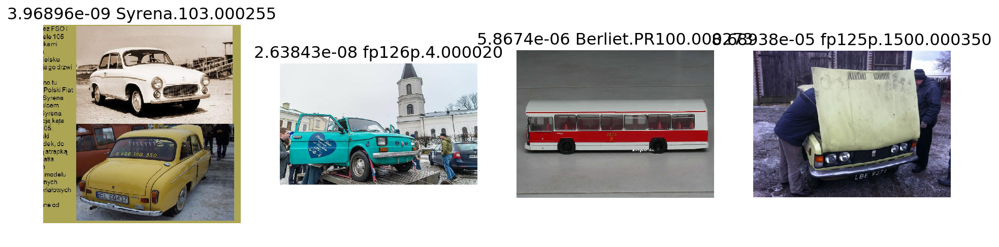

In [0]:
# 1. A few correct labels at random
plot_val_with_title(rand_by_correct(True), "Correctly classified")

Incorrectly classified


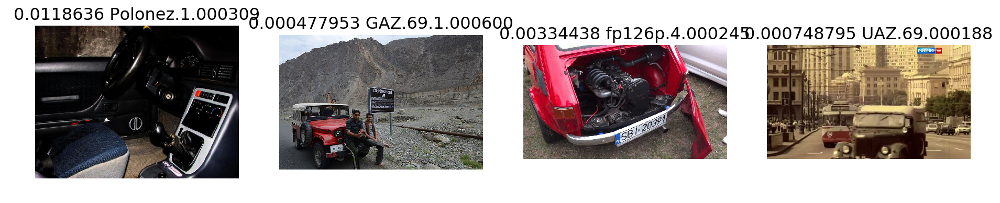

In [0]:
# 2. A few incorrect labels at random
plot_val_with_title(rand_by_correct(False), "Incorrectly classified")

In [0]:
def most_by_mask(mask, mult):
    idxs = np.where(mask)[0]
    return idxs[np.argsort(mult * probs[idxs])[:4]]

def most_by_correct(y, is_correct): 
    mult = -1 if (y==1)==is_correct else 1
    return most_by_mask((preds == data.val_y)==is_correct & (data.val_y == y), mult)

Most correct Autobus Jelcz MZK


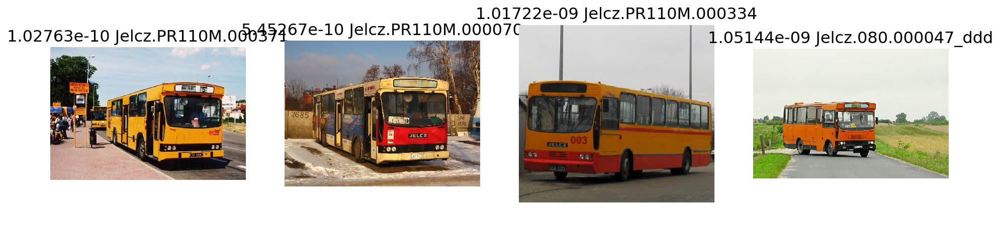

In [0]:
plot_val_with_title(most_by_correct(0, True), "Most correct " + data.classes[0])

Most correct "Autobus Jelcz MZK"
Most correct "Autobus Jelcz Ogorek"
Most correct "FSC Zuk"
Most correct "FSO Polonez"
Most correct "FSO Warszawa"
Most correct "Fiat 125p"
Most correct "Fiat 126p Maluch"
Most correct "Gazik"
Most correct "Syrena 105"
Most correct "ZSD Nysa"


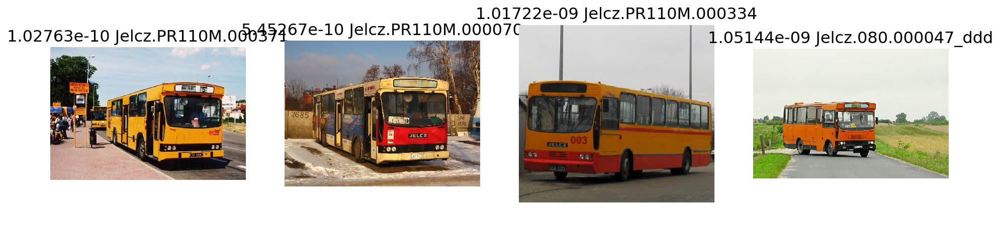

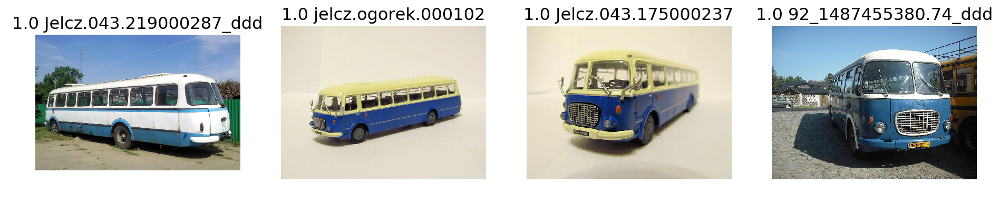

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


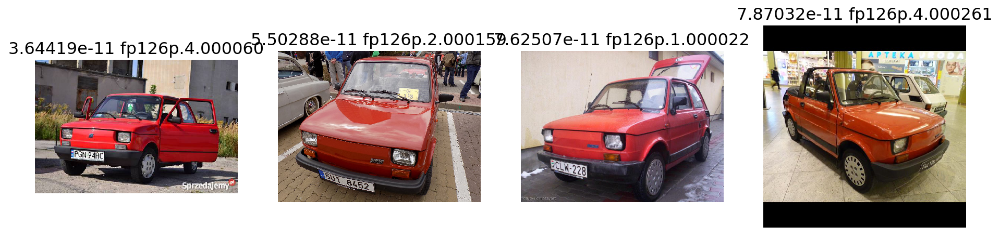

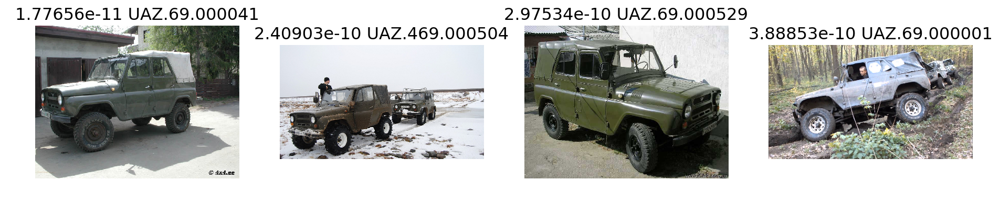

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [0]:
for class_idx, class_name in enumerate(data.classes):
    plot_val_with_title(most_by_correct(class_idx, True), 'Most correct "' + data.classes[class_idx] + '"')

Most incorrect "FSO Warszawa"
Most incorrect "Fiat 125p"


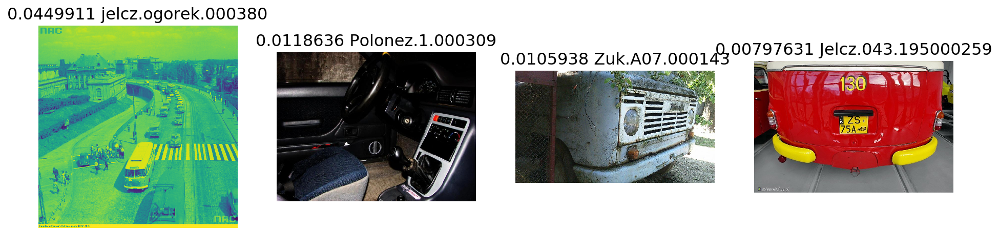

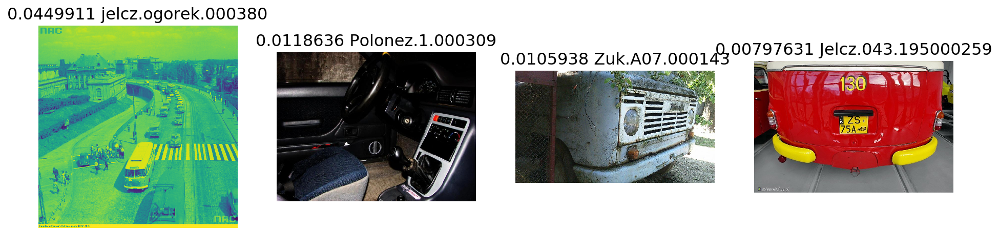

In [0]:
for class_idx, class_name in enumerate(data.classes):
    if class_idx >= 4 and class_idx < 6:
        plot_val_with_title(most_by_correct(class_idx, False), 'Most incorrect "' + data.classes[class_idx] + '"')

Most uncertain predictions


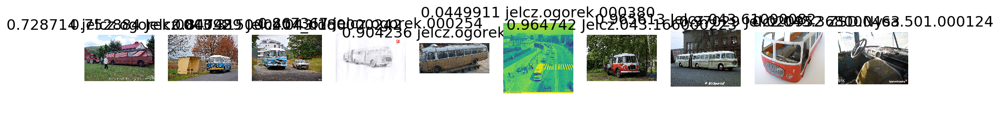

In [0]:
most_uncertain = np.argsort(np.abs(probs -0.5))[:10]
plot_val_with_title(most_uncertain, "Most uncertain predictions")

## Analyzing results

for three classes
* accuracy 0.91027
* 424
* (136+104+145)/424

In [0]:
(136+104+145)/424

for 10 classes, 4 epochs
* accuracy: 0.8282
* val size: 997

## Improving our model

In [0]:
bad_predicted_fnames = []
bad_predicted_idxs = []
bad_predicted_classes = []
# plot table of train or val preds
# idx, image name, correct category, actual category
for idx in range(len(preds)):
    correct_class_idx = data.val_y[idx]
    predicted_class_idx = preds[idx]
    fname = data.val_ds.fnames[idx]
    predicted_class = data.classes[predicted_class_idx]
    if correct_class_idx != predicted_class_idx:
        bad_predicted_fnames.append(fname)
        bad_predicted_idxs.append(idx)
        bad_predicted_classes.append(predicted_class)
        # print(idx, correct_class_idx, predicted_class_idx, probs[idx], data.val_ds.fnames[idx], ',', data.classes[predicted_class_idx])
        print('%s\t%s\t%s\t%s\t%s\t%s' % (idx, correct_class_idx, predicted_class_idx, probs[idx], fname, predicted_class))

In [0]:
#plot bad images
# bad_predicted_idxs
plot_val_with_title(bad_predicted_idxs[0:3], "")

In [0]:
# copy bad predicted images:
for idx, fname in enumerate(bad_predicted_fnames):
    img_path = PATH + fname
    # print(img_path)
    fname = bad_predicted_classes[idx] + ', ' + Path(fname).name
    dest_path = Path(PATH) / "bad_predicted_images" / fname
    print(dest_path)
    sh.copy2(img_path, dest_path)